In [1]:
# Import packages

import os
import pandas as pd
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from wordcloud import WordCloud, STOPWORDS
#from nltk.tokenize import word_tokenize
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
nltk.download('punkt')
nltk.download('stopwords')
import re

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/markusvonderluehe/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/markusvonderluehe/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [8]:
# Initialize variables
'''tweet_count = 5000
username = 'elonmusk'
since_date = '2022-01-01'

# Using OS library to get tweets from a username since a date
os.system(f'snscrape --jsonl --since {since_date} twitter-search "from:{username}"> musk_tweets_2022.json');
tweets_df = pd.read_json('musk_tweets_2022.json', lines=True)'''

'tweet_count = 5000\nusername = \'elonmusk\'\nsince_date = \'2022-01-01\'\n\n# Using OS library to get tweets from a username since a date\nos.system(f\'snscrape --jsonl --since {since_date} twitter-search "from:{username}"> musk_tweets_2022.json\');\ntweets_df = pd.read_json(\'musk_tweets_2022.json\', lines=True)'

In [6]:
tweets_df = pd.read_csv("data/tweets_raw.csv")
tweets_df

,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags,user_name,category,name
0,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1598004480...,2022-11-30 17:22:12+00:00,@EvaFoxU @Reuters Exactly. The obvious reality...,@EvaFoxU @Reuters Exactly. The obvious reality...,1.598004e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",2565.0,9638.0,41337.0,...,1.597924e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,NaN,NaN,elonmusk,Tech CEO,Elon Musk
1,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597982424...,2022-11-30 15:54:33+00:00,Update from @Neuralink at 6pm PT,Update from @Neuralink at 6pm PT,1.597982e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",6211.0,6405.0,71890.0,...,NaN,NaN,"[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,NaN,NaN,elonmusk,Tech CEO,Elon Musk
2,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597887972...,2022-11-30 09:39:14+00:00,@NorthmanTrader @vincent13031925 Exactly,@NorthmanTrader @vincent13031925 Exactly,1.597888e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",569.0,257.0,5336.0,...,1.597881e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,NaN,NaN,elonmusk,Tech CEO,Elon Musk
3,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597878869...,2022-11-30 09:03:04+00:00,@vincent13031925 Trend is concerning. Fed need...,@vincent13031925 Trend is concerning. Fed need...,1.597879e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",7455.0,10295.0,93386.0,...,1.597706e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,NaN,NaN,elonmusk,Tech CEO,Elon Musk
4,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597873111...,2022-11-30 08:40:11+00:00,"@teslaownersSV Much more, but I am simply stat...","@teslaownersSV Much more, but I am simply stat...",1.597873e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",646.0,690.0,9893.0,...,1.597871e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,NaN,NaN,elonmusk,Tech CEO,Elon Musk
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15443,snscrape.modules.twitter.Tweet,https://twitter.com/TheEllenShow/status/147817...,2022-01-04 01:03:23+00:00,The one and only @chefjoseandres is re-opening...,The one and only @chefjoseandres is re-opening...,1.478170e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",79.0,114.0,1197.0,...,NaN,NaN,"[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,NaN,NaN,TheEllenShow,Celebrities,Ellen Degeneres
15444,snscrape.modules.twitter.Tweet,https://twitter.com/TheEllenShow/status/147813...,2022-01-03 22:48:18+00:00,Jim and @speaknowsasha felt like it was the pe...,Jim and @speaknowsasha felt like it was the pe...,1.478136e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",60.0,99.0,909.0,...,NaN,NaN,"[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,['TheVoice'],NaN,TheEllenShow,Celebrities,Ellen Degeneres
15445,snscrape.modules.twitter.Tweet,https://twitter.com/TheEllenShow/status/147808...,2022-01-03 19:36:10+00:00,.@RuPaul took the hot seat in today’s #Burning...,.@RuPaul took the hot seat in today’s #Burning...,1.478088e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",62.0,111.0,1407.0,...,NaN,NaN,"[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,['BurningQuestions'],NaN,TheEllenShow,Celebrities,Ellen Degeneres
15446,snscrape.modules.twitter.Tweet,https://twitter.com/TheEllenShow/status/147805...,2022-01-03 17:29:54+00:00,.@RuPaul is on the show today. https://t.co/yX...,.@RuPaul is on the show today. https://t.co/yX...,1.478056e+18,"{'_type': 'snscrape.mod

In [15]:
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15448 entries, 0 to 15447
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   _type             15448 non-null  object 
 1   url               15444 non-null  object 
 2   date              15442 non-null  object 
 3   content           15442 non-null  object 
 4   renderedContent   15440 non-null  object 
 5   id                15440 non-null  float64
 6   user              15440 non-null  object 
 7   replyCount        15440 non-null  float64
 8   retweetCount      15440 non-null  object 
 9   likeCount         15440 non-null  object 
 10  quoteCount        15440 non-null  object 
 11  conversationId    15440 non-null  object 
 12  lang              15439 non-null  object 
 13  source            15439 non-null  object 
 14  sourceUrl         15440 non-null  object 
 15  sourceLabel       15438 non-null  object 
 16  outlinks          3187 non-null   object

In [12]:
tweets_df["name"].nunique()


18

In [13]:
tweets_df["name"].unique()

array(['Elon Musk', 'Sundar Pichai', 'Tim Cook', 'Jeff Bezos',
       'Satya Nadella', 'Bill Gates', 'Volodymyr Zelenskyy', 'Joe Biden',
       'Alexandria Ocaso-Cortez', 'Ron DeSantis', 'Barack Obama',
       'Narendra Modi', 'Kim Kardashian', 'Rihanna', 'Justin Bieber',
       'Katy Perry', nan, 'Lady Gaga', 'Ellen Degeneres'], dtype=object)

In [43]:
#name = tweets_df.groupby('name').likeCount.mean()




In [17]:
#check variables
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15448 entries, 0 to 15447
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   _type             15448 non-null  object 
 1   url               15444 non-null  object 
 2   date              15442 non-null  object 
 3   content           15442 non-null  object 
 4   renderedContent   15440 non-null  object 
 5   id                15440 non-null  float64
 6   user              15440 non-null  object 
 7   replyCount        15440 non-null  float64
 8   retweetCount      15440 non-null  object 
 9   likeCount         15440 non-null  object 
 10  quoteCount        15440 non-null  object 
 11  conversationId    15440 non-null  object 
 12  lang              15439 non-null  object 
 13  source            15439 non-null  object 
 14  sourceUrl         15440 non-null  object 
 15  sourceLabel       15438 non-null  object 
 16  outlinks          3187 non-null   object

In [6]:
# show the key statistics in comparison of Elon and the others (retweet count, likecount)
# Get the top mentioned users for each follower
# get the content most important words

In [50]:

tweets_df1["retweetCount"].apply(pd.to_numeric, errors='coerce')

#tweets_df1

KeyError: 'retweetCount'

In [23]:
df['foo'] = pd.to_numeric(df['foo'], errors='coerce')
#tweets_df.likeCount.mean()



TypeError: descriptor 'is_integer' for 'float' objects doesn't apply to a 'str' object

In [16]:
#get the statistic metrics

tweets_df.describe()

,id,replyCount,inReplyToTweetId
count,1.544000e+04,1.544000e+04,4.579000e+03
mean,1.541939e+18,1.996678e+14,1.544552e+18
std,3.966417e+16,1.754295e+16,4.474842e+16
min,3.134000e+03,0.000000e+00,2.623659e+17
25%,1.511913e+18,2.610000e+02,1.517688e+18
50%,1.539551e+18,7.050000e+02,1.539366e+18
75%,1.575981e+18,2.060250e+03,1.581372e+18
max,1.598037e+18,1.541436e+18,1.598007e+18


In [18]:
tweets_red = tweets_df[['replyCount', 'retweetCount', 'likeCount']]

tweets_red.round(5)
tweets_red.describe()

,replyCount
count,1.544000e+04
mean,1.996678e+14
std,1.754295e+16
min,0.000000e+00
25%,2.610000e+02
50%,7.050000e+02
75%,2.060250e+03
max,1.541436e+18


In [42]:
#df3 = tweets_df["retweetCount"].astype(int)

#tweets_df["retweetCount"].astype(float).astype(int)
#df3 = tweets_df["retweetCount"].apply(pd.to_numeric, errors='coerce')


0         9638.0
1         6405.0
2          257.0
3        10295.0
4          690.0
          ...   
15443      114.0
15444       99.0
15445      111.0
15446      172.0
15447      104.0
Name: retweetCount, Length: 15448, dtype: float64


(0.0, 10000.0)

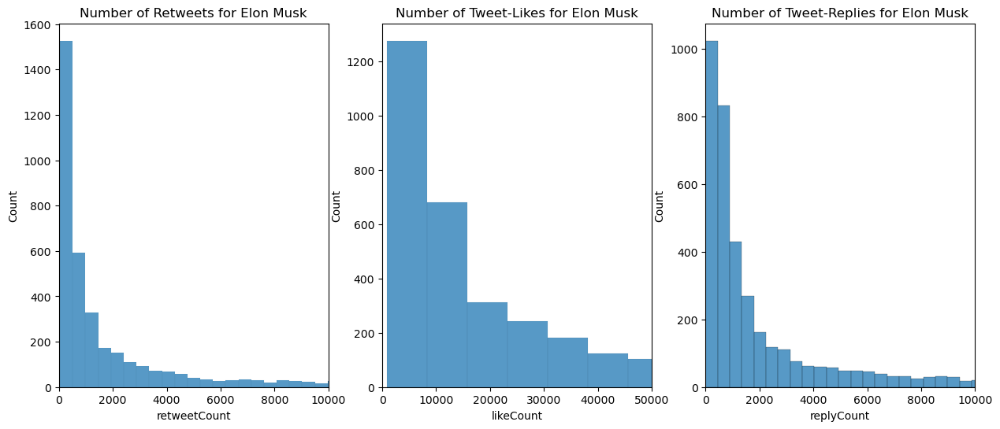

In [11]:
fig, ax = plt.subplots(1, 3, figsize=(15, 6))
sns.histplot(x='retweetCount', data=tweets_df, ax=ax[0])
ax[0].set_title('Number of Retweets for Elon Musk')
ax[0].set_xlim(0, 10000)

sns.histplot(x='likeCount', data=tweets_df, ax=ax[1])
ax[1].set_title('Number of Tweet-Likes for Elon Musk')
ax[1].set_xlim(0, 50000)

#plt.ylim(0, 2000)
plt.xlim(0, 70000)
sns.histplot(x='replyCount', data=tweets_df, ax=ax[2]);
ax[2].set_title('Number of Tweet-Replies for Elon Musk')
ax[2].set_xlim(0, 10000)



<AxesSubplot:>

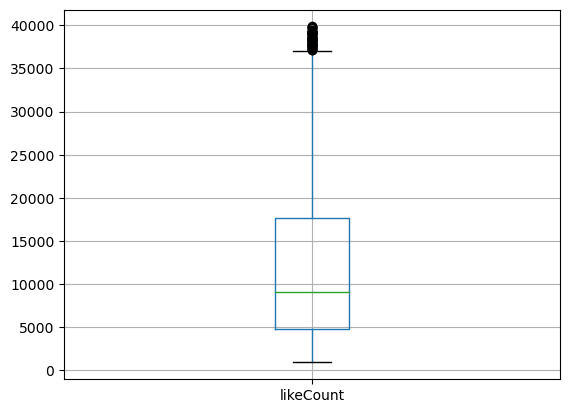

In [12]:
#Boxplot for the Likecount
outlier = tweets_df[tweets_df['likeCount'] < 40000]
outlier.boxplot(column =['likeCount'], grid = True)

<AxesSubplot:>

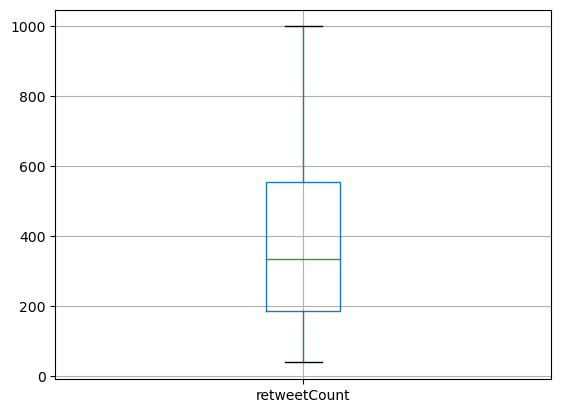

In [13]:
#Boxplot for retweetCount
outlier = tweets_df[tweets_df['retweetCount'] < 1000]
outlier.boxplot(column =['retweetCount'], grid = True)

(0.0, 1000.0)

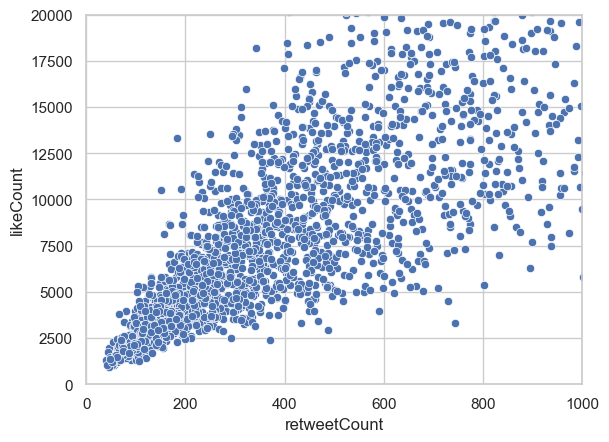

In [14]:

sns.set(style='whitegrid')
 
sns.scatterplot(x="retweetCount",
                    y="likeCount",
                    data=tweets_df)
plt.ylim(0, 20000)
plt.xlim(0, 1000)

In [15]:
pd.options.display.max_colwidth = 200
#print(tweets_df['mentionedUsers'])
pd.set_option('display.max_rows', tweets_df.shape[0]+1)
#print(tweets_df['hashtags'])

In [26]:
for row in tweets_df["content"]:
    print(row)

@EvaFoxU @Reuters Exactly. The obvious reality, as long-time users know, is that Twitter has failed in trust &amp; safety for a very long time and has interfered in elections. 

Twitter 2.0 will be far more effective, transparent and even-handed.
Update from @Neuralink at 6pm PT
@NorthmanTrader @vincent13031925 Exactly
@vincent13031925 Trend is concerning. Fed needs to cut interest rates immediately. They are massively amplifying the probability of a severe recession.
@teslaownersSV Much more, but I am simply stating the obvious
@teslaownersSV We’re implementing anti-bot bots. You should see some improvement by tomorrow.
Microservices …
 https://t.co/w6K0t1SRRs
Twitter core services latency reduced by ~400ms. Should feel noticeably faster.
@SwipeWright @stevenmarkryan @nichegamer 🎯
@stevenmarkryan @nichegamer Sam lost me when he said that any lies at all would justify Trump losing. 

I mean … Sam literally wrote a book about why lying is evil!

https://t.co/KwLOyqHjpu https://t.co/VTbN

In [27]:

stop_words = set(stopwords.words('english'))

#stopwords = stopwords.words('english')+[" ", "based", "regarding", "good", "right", "even", ""]
#print(stop_words)

In [28]:
#saving the Tweet-content in a string variable
x = str(tweets_df["content"])  


#Step 1: tokenizing the string and appending it into a list
token = word_tokenize(x)
#jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

In [29]:
#Step 2: running a regex to keep only alphanumeric
l=[]
for i in range(len(token)):
    l.append(re.sub(r'\W+', '', token[i]))


In [30]:
print(l)

['0', '', 'EvaFoxU', '', 'Reuters', 'Exactly', '', 'The', 'obvious', 'reality', '', '1', 'Update', 'from', '', 'Neuralink', 'at', '6pm', 'PT', '2', '', 'NorthmanTrader', '', 'vincent13031925', 'Exactly', '3', '', 'vincent13031925', 'Trend', 'is', 'concerning', '', 'Fed', 'need', '', '4', '', 'teslaownersSV', 'Much', 'more', '', 'but', 'I', 'am', 'simply', 'stat', '', '', '15443', 'The', 'one', 'and', 'only', '', 'chefjoseandres', 'is', 'reopening', '', '15444', 'Jim', 'and', '', 'speaknowsasha', 'felt', 'like', 'it', 'was', 'the', 'pe', '', '15445', '', '', 'RuPaul', 'took', 'the', 'hot', 'seat', 'in', 'today', '', 's', '', 'Burning', '', '15446', '', '', 'RuPaul', 'is', 'on', 'the', 'show', 'today', '', 'https', '', 'tcoyX', '', '15447', 'You', '', 're', 'a', 'man', 'of', 'many', 'talents', '', 'DaxShepard', '', 'Here', '', 'Name', '', 'content', '', 'Length', '', '15448', '', 'dtype', '', 'object']


In [31]:


#putting list back into a string
#token_2 = (" ".join(l))

#getting the stop words list in english
stop_words = set(stopwords.words('english'))

#selecting only words that are not stop words
filtered = []
for w in l:
    if w.lower() not in stop_words:
        filtered.append(w)
print(filtered) 
#print(word_tokens)
#print(filtered_sentence)'''

['0', '', 'EvaFoxU', '', 'Reuters', 'Exactly', '', 'obvious', 'reality', '', '1', 'Update', '', 'Neuralink', '6pm', 'PT', '2', '', 'NorthmanTrader', '', 'vincent13031925', 'Exactly', '3', '', 'vincent13031925', 'Trend', 'concerning', '', 'Fed', 'need', '', '4', '', 'teslaownersSV', 'Much', '', 'simply', 'stat', '', '', '15443', 'one', '', 'chefjoseandres', 'reopening', '', '15444', 'Jim', '', 'speaknowsasha', 'felt', 'like', 'pe', '', '15445', '', '', 'RuPaul', 'took', 'hot', 'seat', 'today', '', '', 'Burning', '', '15446', '', '', 'RuPaul', 'show', 'today', '', 'https', '', 'tcoyX', '', '15447', '', 'man', 'many', 'talents', '', 'DaxShepard', '', '', 'Name', '', 'content', '', 'Length', '', '15448', '', 'dtype', '', 'object']


In [32]:
word_dic = {}
for i in filtered:
    if i in word_dic:
        word_dic[i] +=1
    else:
        word_dic[i] = 1



In [33]:
s = {k: v for k, v in sorted(word_dic.items(), key=lambda item: item[1], reverse=True)}
print(s)

{'': 37, 'Exactly': 2, 'vincent13031925': 2, 'RuPaul': 2, 'today': 2, '0': 1, 'EvaFoxU': 1, 'Reuters': 1, 'obvious': 1, 'reality': 1, '1': 1, 'Update': 1, 'Neuralink': 1, '6pm': 1, 'PT': 1, '2': 1, 'NorthmanTrader': 1, '3': 1, 'Trend': 1, 'concerning': 1, 'Fed': 1, 'need': 1, '4': 1, 'teslaownersSV': 1, 'Much': 1, 'simply': 1, 'stat': 1, '15443': 1, 'one': 1, 'chefjoseandres': 1, 'reopening': 1, '15444': 1, 'Jim': 1, 'speaknowsasha': 1, 'felt': 1, 'like': 1, 'pe': 1, '15445': 1, 'took': 1, 'hot': 1, 'seat': 1, 'Burning': 1, '15446': 1, 'show': 1, 'https': 1, 'tcoyX': 1, '15447': 1, 'man': 1, 'many': 1, 'talents': 1, 'DaxShepard': 1, 'Name': 1, 'content': 1, 'Length': 1, '15448': 1, 'dtype': 1, 'object': 1}


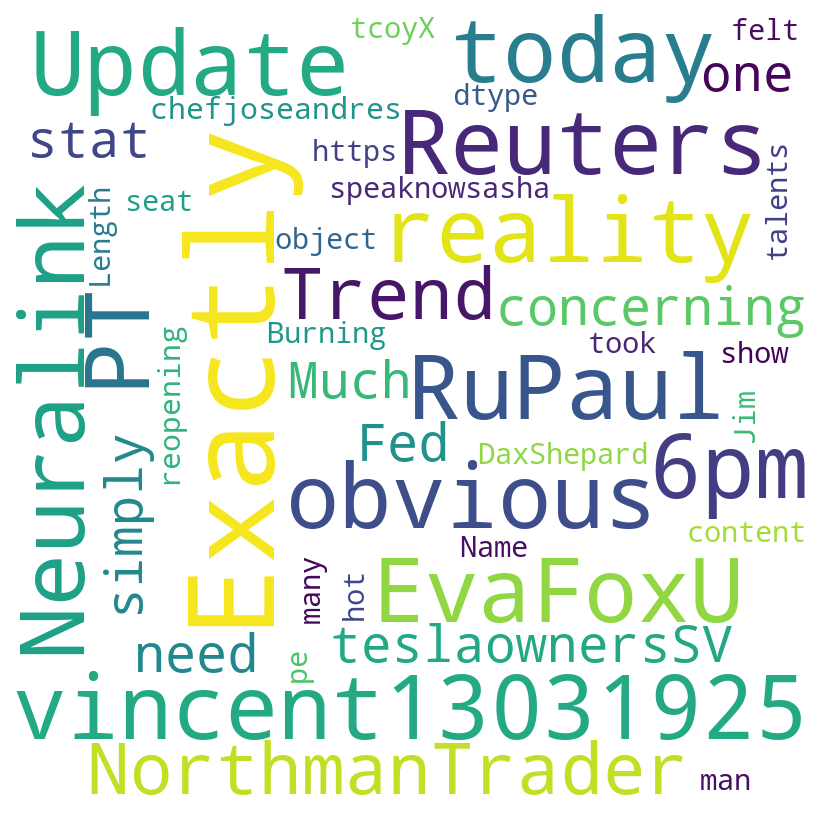

In [34]:
#Wordcloud
comment_words = ''
stopwords = set(STOPWORDS)

 

#putting list back into a string
token_2 = (" ".join(s))

wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(token_2)
 


plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
 
plt.show()

In [73]:
tweets_df



,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
0,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597887972372021248,2022-11-30 09:39:14+00:00,@NorthmanTrader @vincent13031925 Exactly,@NorthmanTrader @vincent13031925 Exactly,1597887972372021248,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",321,80,1470,...,None,NaN,None,1.597881e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'NorthmanTrader', 'id': 714051110, 'displayname': 'Sven Henrich', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'veri...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'NorthmanTrader', 'id': 714051110, 'displayname': 'Sven Henrich', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'ver...",NaN,NaN,None,NaN
1,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597878869910253569,2022-11-30 09:03:04+00:00,@vincent13031925 Trend is concerning. Fed needs to cut interest rates immediately. They are massively amplifying the probability of a severe recession.,@vincent13031925 Trend is concerning. Fed needs to cut interest rates immediately. They are massively amplifying the probability of a severe recession.,1597878869910253569,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",2819,3407,28377,...,None,NaN,None,1.597706e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'vincent13031925', 'id': 1689516060, 'displayname': 'vincentyu.eth', 'description': None, 'rawDescription': None, 'descriptionUrls': None, 'v...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'vincent13031925', 'id': 1689516060, 'displayname': 'vincentyu.eth', 'description': None, 'rawDescription': None, 'descriptionUrls': None, '...",NaN,NaN,None,NaN
2,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597873111470252032,2022-11-30 08:40:11+00:00,"@teslaownersSV Much more, but I am simply stating the obvious","@teslaownersSV Much more, but I am simply stating the obvious",1597873111470252032,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",439,265,3639,...,None,NaN,None,1.597871e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'descr...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'desc...",NaN,NaN,None,NaN
3,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597867558073667584,2022-11-30 08:18:07+00:00,@teslaownersSV We’re implementing anti-bot bots. You should see some improvement by tomorrow.,@teslaownersSV We’re implementing anti-bot bots. You should see some improvement by tomorrow.,1597867558073667584,"{'_type': 'snscrape.modules.twitter.User', 'username': 'elonmusk', 'id': 44196397, 'displayname': 'Elon Musk', 'description': '', 'rawDescription': '', 'descriptionUrls': None, 'verified': True, '...",728,524,4157,...,None,NaN,None,1.597867e+18,"{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'displayname': 'Tesla Owners Silicon Valley', 'description': None, 'rawDescription': None, 'descr...","[{'_type': 'snscrape.modules.twitter.User', 'username': 'teslaownersSV', 'id': 1016059981907386368, 'disp

In [19]:
for i in tweets_df:
    print(tweets_df["likeCount"])

0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898
Name: likeCount, Length: 4088, dtype: int64
0         1470
1        28377
2         3639
3         4157
4        12213
         ...  
4083    456147
4084    306891
4085     63962
4086     42845
4087      3898

In [32]:
tweets_df

,_type,url,date,content,renderedContent,id,user,replyCount,retweetCount,likeCount,...,media,retweetedTweet,quotedTweet,inReplyToTweetId,inReplyToUser,mentionedUsers,coordinates,place,hashtags,cashtags
0,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597887972...,2022-11-30 09:39:14+00:00,@NorthmanTrader @vincent13031925 Exactly,@NorthmanTrader @vincent13031925 Exactly,1597887972372021248,"{'_type': 'snscrape.modules.twitter.User', 'us...",321,80,1470,...,None,NaN,None,1.597881e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
1,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597878869...,2022-11-30 09:03:04+00:00,@vincent13031925 Trend is concerning. Fed need...,@vincent13031925 Trend is concerning. Fed need...,1597878869910253569,"{'_type': 'snscrape.modules.twitter.User', 'us...",2819,3407,28377,...,None,NaN,None,1.597706e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
2,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597873111...,2022-11-30 08:40:11+00:00,"@teslaownersSV Much more, but I am simply stat...","@teslaownersSV Much more, but I am simply stat...",1597873111470252032,"{'_type': 'snscrape.modules.twitter.User', 'us...",439,265,3639,...,None,NaN,None,1.597871e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
3,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597867558...,2022-11-30 08:18:07+00:00,@teslaownersSV We’re implementing anti-bot bot...,@teslaownersSV We’re implementing anti-bot bot...,1597867558073667584,"{'_type': 'snscrape.modules.twitter.User', 'us...",728,524,4157,...,None,NaN,None,1.597867e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
4,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1597866295...,2022-11-30 08:13:06+00:00,Microservices …\n https://t.co/w6K0t1SRRs,Microservices …\n m.youtube.com/watch?v=y8Onox…,1597866295617167360,"{'_type': 'snscrape.modules.twitter.User', 'us...",1370,909,12213,...,None,NaN,None,1.597829e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...",None,NaN,NaN,None,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4083,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477775713...,2022-01-02 22:56:00+00:00,https://t.co/LA9hPzVlGx,https://t.co/LA9hPzVlGx,1477775713172402176,"{'_type': 'snscrape.modules.twitter.User', 'us...",24588,48212,456147,...,"[{'_type': 'snscrape.modules.twitter.Photo', '...",NaN,None,NaN,None,None,NaN,NaN,None,NaN
4084,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477706142...,2022-01-02 18:19:33+00:00,Let’s make the roaring 20’s happen!,Let’s make the roaring 20’s happen!,1477706142461706248,"{'_type': 'snscrape.modules.twitter.User', 'us...",21460,25035,306891,...,None,NaN,None,NaN,None,None,NaN,NaN,None,NaN
4085,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477700424...,2022-01-02 17:56:50+00:00,Great work by Tesla team worldwide! https://t....,Great work by Tesla team worldwide! twitter.co...,1477700424933253123,"{'_type': 'snscrape.modules.twitter.User', 'us...",5449,4216,63962,...,None,NaN,"{'_type': 'snscrape.modules.twitter.Tweet', 'u...",NaN,None,None,NaN,NaN,None,NaN
4086,snscrape.modules.twitter.Tweet,https://twitter.com/elonmusk/status/1477096955...,2022-01-01 01:58:52+00:00,@BLKMDL3 @Tesla 🔥,@BLKMDL3 @Tesla 🔥,1477096955658579974,"{'_type': 'snscrape.modules.twitter.User', 'us...",1026,444,42845,...,None,NaN,None,1.476958e+18,"{'_type': 'snscrape.modules.twitter.User', 'us...","[{'_type': 'snscrape.modules.twitter.User', 'u...",NaN,NaN,None,NaN
